# Introduction

In this notebook, we get the initially cleaned eviction data and turn it into geodataframe. By aggregating based on bbl, we visualized the eviction distribution in nyc with plotly. (We will focus on Folium graphs in a different notebook). We break down plotly graphs into different boroughs for clarity and technical convenience (easier to zoom in and zoom out). Graphs shown below are only screenshots, as the original output is too large to manage for github but re-run the cells should be able to replicate the screenshot-view.

For next notebooks, we re-org the table to get the top 20 buildings with the most evictions happened on average per year during 2017 - 2024. Further analysis will continue in the same series notebooks until clustering analysis and getting to know the data is done.

In [2]:
# !pip install geopandas folium matplotlib seaborn scipy
# !pip install esda
# !pip install splot
# # for google colab, had to reinstall some pacakges.

In [ ]:
# !pip install geopandas folium matplotlib seaborn scipy esda splot

In [3]:
import pandas as pd
import geopandas as gpd
import numpy as np
import datetime as dt
import scipy

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# visualization
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns
import folium
from folium.plugins import HeatMap
from folium import Marker
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.io as pio

# spatial statistics
from esda.moran import Moran
from esda.getisord import G_Local
from libpysal.weights import Queen, Rook

# system and utility
import warnings
import os
import io
from IPython.display import IFrame
from google.colab import files

from libpysal.weights import Queen, Rook
from esda.moran import Moran
import matplotlib.pyplot as plt
from splot.esda import moran_scatterplot

# suppress warnings
warnings.filterwarnings('ignore')

# inline
%matplotlib inline

# Part 1 Get the Eviction data

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# data source:
file_path = '/content/drive/My Drive/X999/evictions_df_cleaned.csv'

In [6]:
evictions_df_raw = pd.read_csv(file_path)

In [7]:
evictions_df = evictions_df_raw.copy()

In [8]:
evictions_df.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,-74.011883,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,-74.017068,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West


In [9]:
evictions_df.columns, \
evictions_df.shape

(Index(['court_index_number', 'docket_number', 'eviction_address',
        'eviction_apartment_number', 'executed_date', 'borough',
        'eviction_postcode', 'ejectment', 'eviction/legal_possession',
        'latitude', 'longitude', 'community_board', 'council_district',
        'census_tract', 'bin', 'bbl', 'nta'],
       dtype='object'),
 (76484, 17))

In [10]:
evictions_df.executed_date = pd.to_datetime(evictions_df.executed_date)

In [11]:
evictions_df.executed_date.min(), evictions_df.executed_date.max()

(Timestamp('2017-01-03 00:00:00'), Timestamp('2024-09-16 00:00:00'))

# Part 2 Get to know the GeoDataFrame

#### To properly understand the geo features and find hot spots in this evcition datasets, we need to utilize the GeoDataFrame to see if there is any interesting patterns that could be attributed to Societal trends/Predatory landlord bahaviors/corporate landlord behaviors

In [12]:
# first, we create a GeoDataFrame
evictions_gdf = gpd.GeoDataFrame(
    evictions_df,
    geometry=gpd.points_from_xy(evictions_df['longitude'], evictions_df['latitude']))

In [13]:
evictions_gdf.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta,geometry
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,-74.011883,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East,POINT (-74.01188 40.63594)
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,-74.017068,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West,POINT (-74.01707 40.64001)


In [14]:
evictions_cleaned = evictions_gdf.dropna(subset=['latitude', 'longitude'])
evictions_cleaned = evictions_cleaned.reset_index(drop=True)

In [15]:
evictions_cleaned.columns

Index(['court_index_number', 'docket_number', 'eviction_address',
       'eviction_apartment_number', 'executed_date', 'borough',
       'eviction_postcode', 'ejectment', 'eviction/legal_possession',
       'latitude', 'longitude', 'community_board', 'council_district',
       'census_tract', 'bin', 'bbl', 'nta', 'geometry'],
      dtype='object')

### Part 2.1 getting to know the yearly data distribution of the evictions


In [16]:
evictions_gdf.executed_date.min(), evictions_gdf.executed_date.max()

(Timestamp('2017-01-03 00:00:00'), Timestamp('2024-09-16 00:00:00'))

In [17]:
full_year_data = evictions_gdf[evictions_gdf['executed_date'].dt.year != 2024]

In [18]:
# note, only counting the full year ones, 2017 - 2023
# this will help us better understand the viz later
unique_evictions = len(full_year_data.court_index_number.unique())
unique_evictions_per_year = unique_evictions/7
unique_evictions, unique_evictions_per_year

(66892, 9556.0)

### Part 2.1: Aggregation to find eviction counts (with BBL)

#### Aggregate by BBL:

BBL appears to be the most sensible basic unit here, as other ones: apartment unit, neighborhood, zipcode, and borough would either be too small (non-representable) or too large to understand landlord behaviors.

In [19]:
# groupby
evictions_by_bbl = evictions_cleaned.groupby('bbl').size().reset_index(name='eviction_count')
# merge
evictions_cleaned = evictions_cleaned.merge(evictions_by_bbl, on='bbl', how='left')

In [20]:
evictions_cleaned.columns
# eviction_count added

Index(['court_index_number', 'docket_number', 'eviction_address',
       'eviction_apartment_number', 'executed_date', 'borough',
       'eviction_postcode', 'ejectment', 'eviction/legal_possession',
       'latitude', 'longitude', 'community_board', 'council_district',
       'census_tract', 'bin', 'bbl', 'nta', 'geometry', 'eviction_count'],
      dtype='object')

In [21]:
# normalize the eviction counts by year and get the average counts:
evictions_cleaned['year'] = evictions_cleaned['executed_date'].dt.year  # Extract year from executed_date
eviction_counts = evictions_cleaned.groupby(['bbl', 'year']).size().reset_index(name='eviction_count')
yearly_avg_evictions = eviction_counts.groupby('bbl')['eviction_count'].mean().reset_index(name='average_year_eviction_count')

In [22]:
# merge
evictions_cleaned = evictions_cleaned.merge(yearly_avg_evictions, on='bbl', how='left')

In [23]:
evictions_cleaned.columns
# average_year_eviction_count added

Index(['court_index_number', 'docket_number', 'eviction_address',
       'eviction_apartment_number', 'executed_date', 'borough',
       'eviction_postcode', 'ejectment', 'eviction/legal_possession',
       'latitude', 'longitude', 'community_board', 'council_district',
       'census_tract', 'bin', 'bbl', 'nta', 'geometry', 'eviction_count',
       'year', 'average_year_eviction_count'],
      dtype='object')

In [24]:
evictions_cleaned.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,...,community_board,council_district,census_tract,bin,bbl,nta,geometry,eviction_count,year,average_year_eviction_count
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,...,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East,POINT (-74.01188 40.63594),3,2024,3.0
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,...,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West,POINT (-74.01707 40.64001),3,2024,3.0


### Part 2.2 Visualize the GeoDataFrame -- Plotly and Folium

#### Plotly first:

### Before going into the viz of Plotly, several questions to consider:
- per year, from 2017 to 2023, we have around 9556.0 counts of evictions.
- in total, we have 66892 counts of evictions
- as of 2023, nyc had 3,705,000 total housing units: 1,109,000 are owner-occupied and 2,324,000 are renter-occupied. (source: https://www.nyc.gov/content/tenantprotection/pages/fast-facts-about-housing-in-nyc)
- approximately 55,000 multi-family rental properties in nyc, which contain over 1.3 million units (source: same as above)

### Other things to consider / worth of digging into:

- NYC, home ownership: only 30%, whereas national is 66%. (source: https://comptroller.nyc.gov/reports/spotlight-new-york-citys-homeowner-housing-market/#:~:text=The%20homeownership%20rate%20in%20New,occupied%20housing%20in%20the%20city.)
- very small number of the evictions may be due to maintenance issues by homeowners, and therefore, we might need to find them and get rid of them. But the number might be very small to be considered for this dataset.

Saving nyc_housing_data.png to nyc_housing_data.png


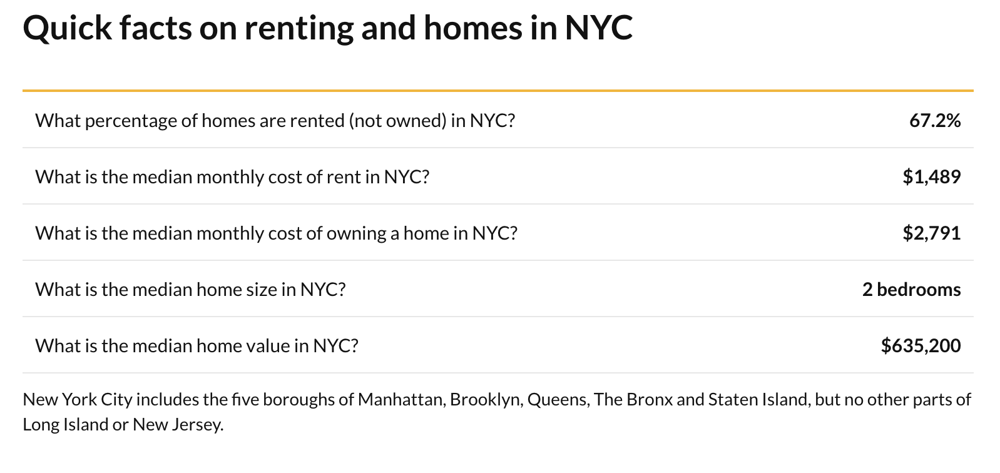

In [26]:
# some general info:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='nyc_housing_data.png')

## source: https://www.valuepenguin.com/new-york-city-renters-statistics#:~:text=or%20New%20Jersey.-,Do%20more%20people%20rent%20or%20own%20in%20NYC?,owning

In [1]:
# scatter map showing eviction counts by BBL
# a very basic and high-level visualization of each building's annual eviction during the year 2017 -2024
# the outlines are clear. They are the lighter and orange ones.
# fig = px.scatter_geo(evictions_cleaned,
#                      lat='latitude', lon='longitude',
#                      color='average_year_eviction_count',
#                      hover_name='bbl',
#                      title="Evictions by BBL in NYC")

# fig.update_geos(scope='usa', fitbounds="locations")
# fig.show()

# make the dots smaller.

# make the dots smaller and on the building,
# then zooming in and out becomes bulky and slow.

fig = px.scatter_geo(evictions_cleaned,
                     lat='latitude', lon='longitude',
                     color='average_year_eviction_count',
                     hover_name='bbl',
                     title="Evictions by BBL in NYC",
                     size='average_year_eviction_count',
                      size_max=5)

fig.update_geos(scope='usa', fitbounds="locations")
fig.show()


Saving plotly_image2.png to plotly_image2.png


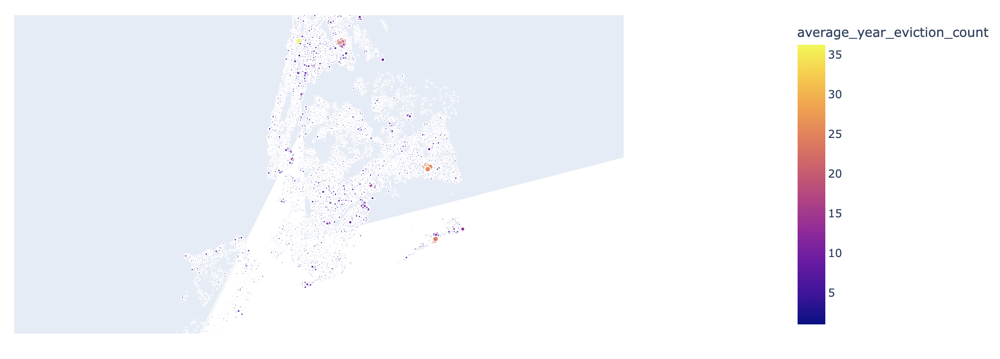

In [ ]:
# in case the graph does not load, it is as shown below
# it is originally an interactive graph where if you point to a building, you get the bbl id, laititude, longitude, and
# the annual eviction counts
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='plotly_image2.png')

In [ ]:
# manhattan
evictions_manhattan = evictions_cleaned[evictions_cleaned['borough'] == 'MANHATTAN']
evictions_manhattan.shape, \
# evictions_manhattan.head(2)
# evictions_cleaned['borough'].unique()

((11570, 21),)

In [ ]:
# therefore, we break the areas down into borough
# easier to zoom in and out and see the numbers on the buildings
# the same as above, the larger the dots and lighter the dots, the more evictions that building has

fig = px.scatter_mapbox(evictions_manhattan,
                        lat='latitude', lon='longitude',
                        color='average_year_eviction_count',
                        hover_name='bbl',
                        title="Evictions by BBL in Manhattan NYC",
                        size='average_year_eviction_count',
                        size_max=5,
                        # change the zoom initial value accordingly
                        zoom=12)
# there are some other styles, "open-street-map", "stamen-terrain", "white-bg"
# "carto-darkmatter" strikes a good balance between details and volumne
fig.update_layout(mapbox_style="carto-positron")
fig.show()


Saving plotly_image_manhattan.png to plotly_image_manhattan.png


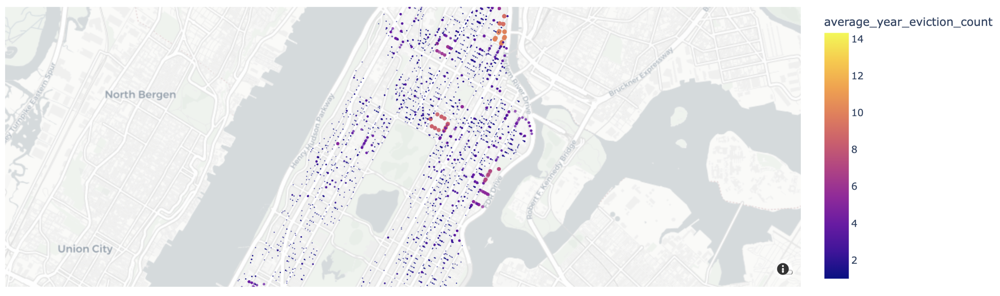

In [ ]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='plotly_image_manhattan.png')

In [ ]:
evictions_cleaned['borough'].unique()

array(['BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS', 'MANHATTAN'],
      dtype=object)

In [29]:
evictions_bronx = evictions_cleaned[evictions_cleaned['borough'] == 'BRONX']
evictions_bronx.shape

(26659, 21)

In [2]:
# bronx
fig = px.scatter_mapbox(evictions_bronx,
                        lat='latitude', lon='longitude',
                        color='average_year_eviction_count',
                        hover_name='bbl',
                        title="Evictions by BBL in Bonx NYC",
                        size='average_year_eviction_count',
                        size_max=5,
                        # change the zoom initial value accordingly
                        zoom=11)
# there are some other styles, "open-street-map", "stamen-terrain", "white-bg"
# "carto-darkmatter" strikes a good balance between details and volumne
fig.update_layout(mapbox_style="carto-positron")
fig.show()

In [38]:
# bronx
# better visualization, easily reproducible for other boroughs
# scatter plot
fig = px.scatter_mapbox(
    evictions_bronx,
    lat='latitude',
    lon='longitude',
    color='average_year_eviction_count',
    hover_name='bbl',
    title="Evictions by BBL in Bronx NYC",
    size='average_year_eviction_count',
    size_max= 10
)

fig.update_layout(
    mapbox=dict(
        style="carto-positron",
        # "open-street-map", "carto-darkmatter", "stamen-terrain"
        # center=dict(lat=40.837048, lon=-73.865433),  #
        zoom= 16
    ),
    # setting right, top, left, and bottom to 0 removes the extra padding around the map
    margin={"r":0,"t":0,"l":0,"b":0},
    autosize=True
)

fig.show()

Saving bronx_redone.png to bronx_redone.png


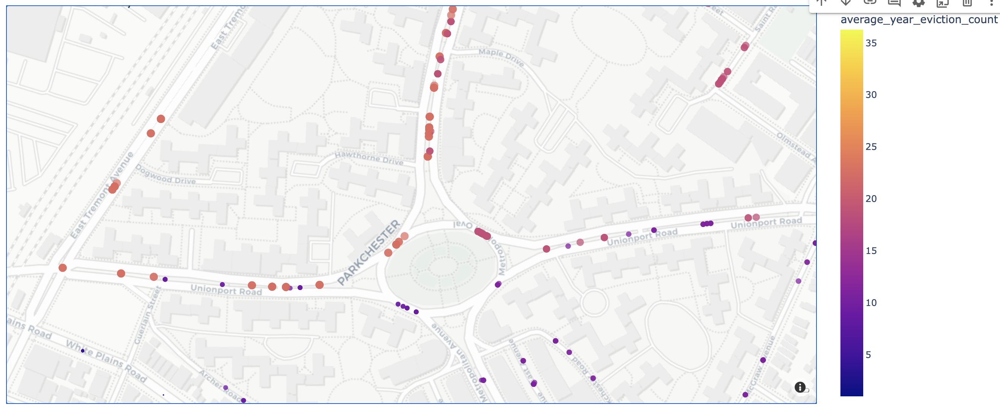

In [37]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='bronx_redone.png')

In [ ]:
# !pip install contextily

In [ ]:
# try contextily
# import contextily as ctx

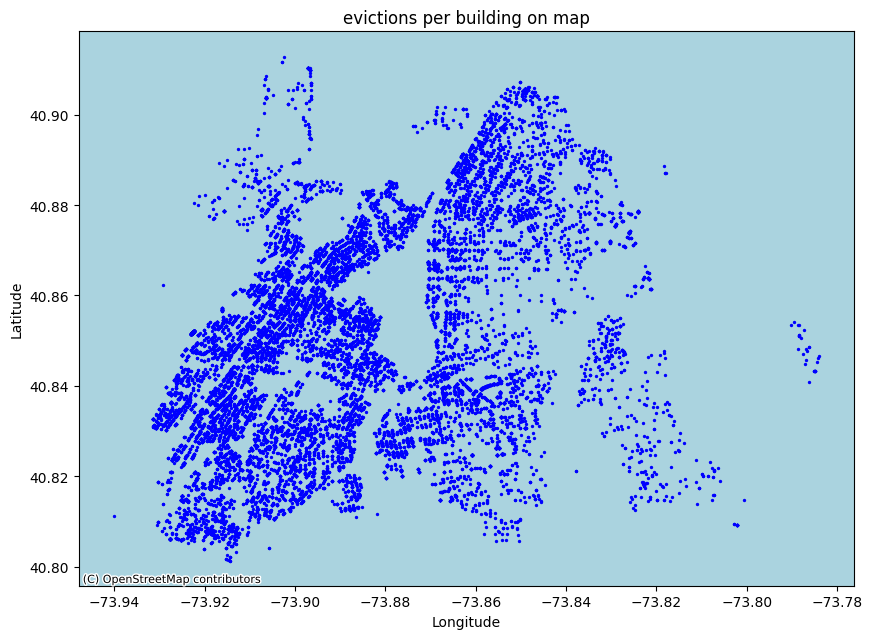

In [ ]:
## use contextily
## not as good as plotly

# fig, ax = plt.subplots(figsize=(10, 10))
# evictions_bronx.plot(ax=ax, color='blue', markersize=2)
# ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# plt.title('evictions per building on map')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.show()

Saving plotly_image_bronx.png to plotly_image_bronx.png


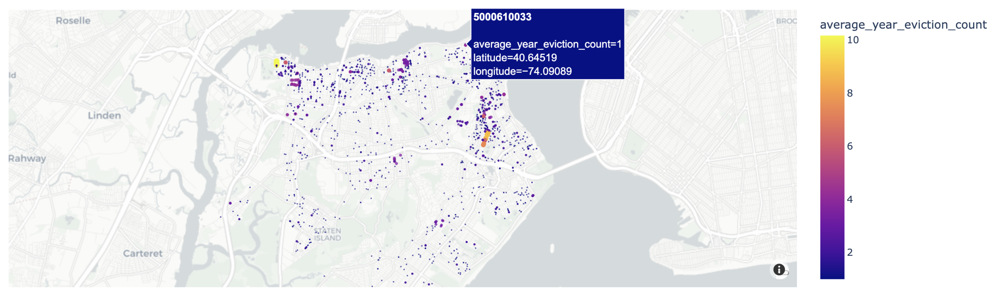

In [ ]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='plotly_image_staten_island.png')

In [3]:
# staten island
evictions_staten_island = evictions_cleaned[evictions_cleaned['borough'] == 'STATEN ISLAND']
# evictions_staten_island.shape
# fig = px.scatter_mapbox(evictions_staten_island,
#                         lat='latitude', lon='longitude',
#                         color='average_year_eviction_count',
#                         hover_name='bbl',
#                         title="Evictions by BBL in Staten Island NYC",
#                         size='average_year_eviction_count',
#                         size_max=10,
#                         # change the zoom initial value accordingly
#                         zoom=17)
# # there are some other styles, "open-street-map", "stamen-terrain", "white-bg"
# # "carto-darkmatter" strikes a good balance between details and volumne
# fig.update_layout(mapbox_style="carto-positron")
# fig.show()

fig = px.scatter_mapbox(
    evictions_staten_island,
    lat='latitude',
    lon='longitude',
    color='average_year_eviction_count',
    hover_name='bbl',
    title="Evictions by BBL in Staten Island NYC",
    size='average_year_eviction_count',
    size_max= 10
)

fig.update_layout(
    mapbox=dict(
        style="carto-positron",
        # "open-street-map", "carto-darkmatter", "stamen-terrain"
        # center=dict(lat=40.837048, lon=-73.865433),  #
        zoom= 16
    ),
    # setting right, top, left, and bottom to 0 removes the extra padding around the map
    margin={"r":0,"t":0,"l":0,"b":0},
    autosize=True
)

fig.show()

Saving plotly_image_staten_island.png to plotly_image_staten_island.png


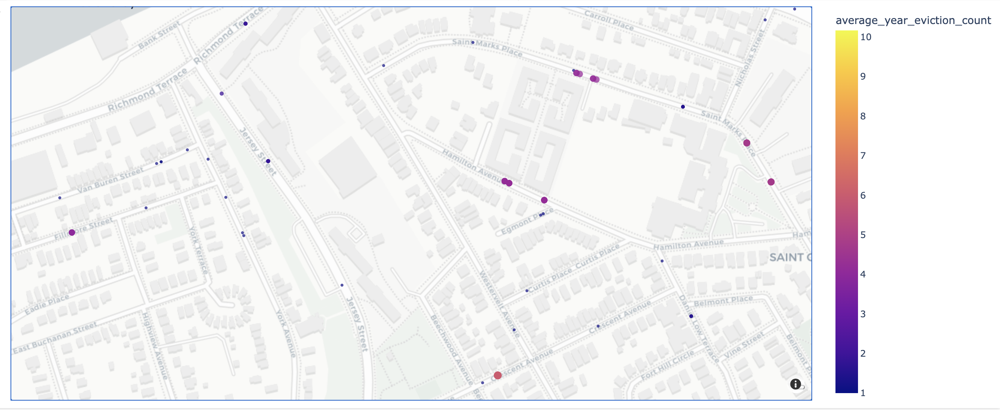

In [40]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='plotly_image_staten_island.png')

In [ ]:
# Queens (zooming out version)
evictions_staten_queens = evictions_cleaned[evictions_cleaned['borough'] == 'QUEENS']
evictions_staten_queens.shape
fig = px.scatter_mapbox(evictions_staten_queens,
                        lat='latitude', lon='longitude',
                        color='average_year_eviction_count',
                        hover_name='bbl',
                        title="Evictions by BBL in Queens NYC",
                        size='average_year_eviction_count',
                        size_max=5,
                        # change the zoom initial value accordingly
                        zoom=11)
# there are some other styles, "open-street-map", "stamen-terrain", "white-bg"
# "carto-darkmatter" strikes a good balance between details and volumne
fig.update_layout(mapbox_style="carto-positron")
fig.show()

Saving plotly_image_queens.png to plotly_image_queens.png


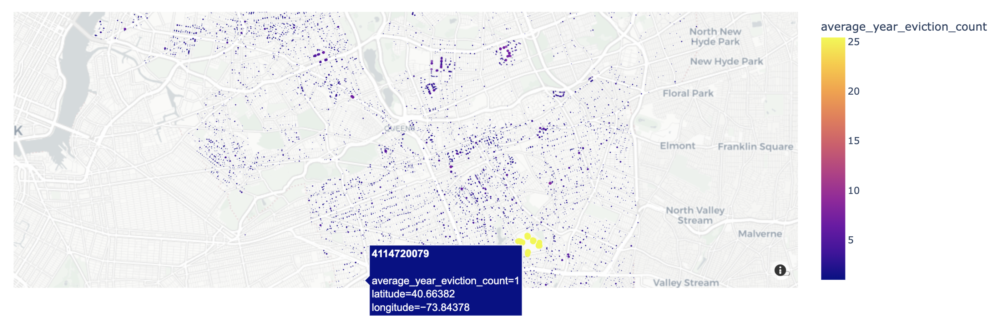

In [ ]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='plotly_image_queens.png')

In [ ]:
# Brooklyn (zooming out version)
evictions_staten_brooklyn = evictions_cleaned[evictions_cleaned['borough'] == 'BROOKLYN']
evictions_staten_brooklyn.shape
fig = px.scatter_mapbox(evictions_staten_brooklyn,
                        lat='latitude', lon='longitude',
                        color='average_year_eviction_count',
                        hover_name='bbl',
                        title="Evictions by BBL in Brooklyn NYC",
                        size='average_year_eviction_count',
                        size_max=5,
                        # change the zoom initial value accordingly
                        zoom=11)
# there are some other styles, "open-street-map", "stamen-terrain", "white-bg"
# "carto-darkmatter" strikes a good balance between details and volumne
fig.update_layout(mapbox_style="carto-positron")
fig.show()

Saving plotly_image_brooklyn.png to plotly_image_brooklyn.png


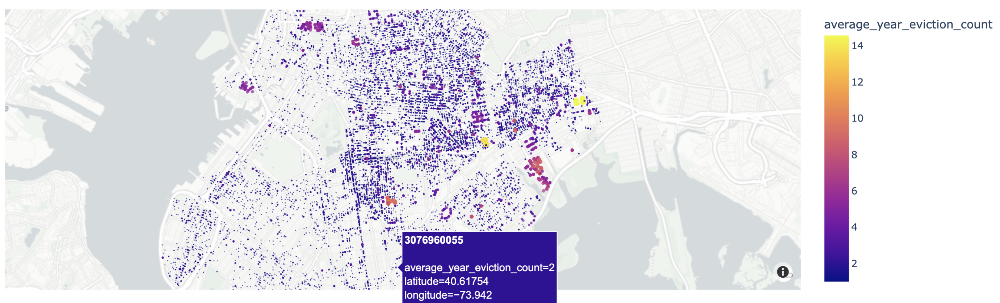

In [ ]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='plotly_image_brooklyn.png')

In [ ]:
# save as an interactive HTML file
# pio.write_html(fig, file='evictions_map.html', auto_open=False)

#### Short summaries:  
- What Plotly shows here is that certain buildings have more evictions than others. Most buildings have fewer than 5 evictions per year, but a few of them have more than 20 evictions per year on average during the year 2017 to 2024.
